# WaterMeter - François Goujon

In [1]:
from keras import backend as K
import tensorflow as tf
import keras
import cv2
from sklearn.model_selection import train_test_split
from keras.callbacks import ModelCheckpoint
from keras.optimizers import adam_v2
from keras.layers import *
from keras.applications.mobilenet_v2 import MobileNetV2
import numpy as np
from keras.models import Model
from keras.models import model_from_json
import matplotlib.pyplot as plt
import os
from scipy.io import loadmat
import pytesseract
from pytesseract import Output

In [2]:
#Variables
img_w = 512   # Largeur image
img_h = 512   # Hauteur image
channels = 3  # Canaux (bgr)
classes = 1   # 1 seule classe (on cherche les textes)
info = 5      # 5 infos par case (texte présent dans la case, coordonnées centre dans la case, largeur boite, hateur boite)
grid_w = 16   # Nombre de colonnes de la matrice
grid_h = 16   # Nombre de lignes de la matrice

In [3]:
#import data, X et Y fait avec Preprocess.ipynb
X = np.load('Datayolo/X.npy')
Y = np.load('Datayolo/Y.npy')

In [4]:
print(X.shape , Y.shape)

(32, 512, 512, 3) (32, 16, 16, 1, 5)


In [5]:
X_train , X_val , Y_train , Y_val  = train_test_split(X,Y,train_size = 28 , shuffle = True)
X = []
Y = []
print(X_train.shape)
print(Y_train.shape)
print(X_val.shape)
print(Y_val.shape)

(28, 512, 512, 3)
(28, 16, 16, 1, 5)
(4, 512, 512, 3)
(4, 16, 16, 1, 5)


In [6]:
#model YOLO
# input : 512,512,3
# output : 16,16,1,5

def save_model(model):
    model_json = model.to_json()
    with open("model/text_detect_model.json", "w") as json_file:
        json_file.write(model_json)     
        
def load_model(strr):        
    json_file = open(strr, 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)
    return loaded_model
   

def yolo_model(input_shape):  
    
    inp = Input(input_shape)
   
    model = MobileNetV2( input_tensor= inp , include_top=False, weights='imagenet')
    last_layer = model.output
    
    conv = Conv2D(512,(3,3) , activation='relu' , padding='same')(last_layer)
    conv = Dropout(0.4)(conv)
    bn = BatchNormalization()(conv)
    lr = LeakyReLU(alpha=0.1)(bn)
    
    
    conv = Conv2D(128,(3,3) , activation='relu' , padding='same')(lr)
    conv = Dropout(0.4)(conv)
    bn = BatchNormalization()(conv)
    lr = LeakyReLU(alpha=0.1)(bn)
    
    
    conv = Conv2D(5,(3,3) , activation='sigmoid' , padding='same')(lr)
    
    final = Reshape((grid_h,grid_w,classes,info))(conv)
    
    model = Model(inp,final)
    
    return model

In [7]:
#fonction loss pour model YOLO (selon celle donné dans la publication)
# y_true : 16,16,1,5
# y_pred : 16,16,1,5
def yolo_loss_func(y_true,y_pred):
    l_coords = 5.0
    l_noob = 0.5
    coords = y_true[:,:,:,:,0] * l_coords
    noobs = (-1*(y_true[:,:,:,:,0] - 1)*l_noob)  #inversé * 0.5
    p_true = y_true[:,:,:,:,0]
    p_pred = y_pred[:,:,:,:,0]
    x_true = y_true[:,:,:,:,1]
    x_pred = y_pred[:,:,:,:,1]
    yy_true = y_true[:,:,:,:,2]
    yy_pred = y_pred[:,:,:,:,2]
    w_true = y_true[:,:,:,:,3]
    w_pred = y_pred[:,:,:,:,3]
    h_true = y_true[:,:,:,:,4]
    h_pred = y_pred[:,:,:,:,4]
    
    p_loss_absent = K.sum(K.square(p_pred - p_true)*noobs)
    p_loss_absent = tf.cast(p_loss_absent, tf.float32)
    p_loss_present = K.sum(K.square(p_pred - p_true))
    p_loss_present = tf.cast(p_loss_present, tf.float32)
    x_loss = K.sum(K.square(x_pred - x_true)*coords)
    x_loss = tf.cast(x_loss, tf.float32)
    yy_loss = K.sum(K.square(yy_pred - yy_true)*coords)
    yy_loss = tf.cast(yy_loss, tf.float32)
    xy_loss = x_loss + yy_loss
    w_loss = K.sum(K.square(K.sqrt(w_pred) - K.sqrt(w_true))*coords)
    h_loss = K.sum(K.square(K.sqrt(h_pred) - K.sqrt(h_true))*coords)
    wh_loss = w_loss + h_loss
    
    loss = p_loss_absent + p_loss_present + xy_loss + wh_loss
    
    return loss

In [9]:
# modele summary et save
input_size = (img_h,img_w,channels)

model = yolo_model(input_size)

print(model.summary())

save_model(model)

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 256, 256, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 256, 256, 32) 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 256, 256, 32) 0           bn_Conv1[0][0]                   
______________________________________________________________________________________________

/Users/francoisgoujon/miniconda/envs/gti771/lib/python3.8/site-packages/keras/utils/generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


In [10]:
#optimizer
opt = adam_v2.Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)

#checkpoint
checkpoint = ModelCheckpoint('model1/text_detect.h5', monitor='val_loss', verbose=1, save_best_only=True, mode='min',save_freq=1)

In [11]:
model.load_weights('model/text_detect.h5')

In [12]:
model.compile(loss=yolo_loss_func , optimizer= opt , metrics = ['accuracy'])

In [12]:
hist = model.fit(X_train ,Y_train ,epochs= 5 ,batch_size = 4 , callbacks=[checkpoint] , validation_data=(X_val,Y_val))

Epoch 1/5
7/7 [==============================] - 44s 2s/step - loss: 40.1001 - accuracy: 0.0126 - val_loss: 29.4259 - val_accuracy: 9.7656e-04
Epoch 2/5
7/7 [==============================] - 13s 2s/step - loss: 22.0459 - accuracy: 0.0016 - val_loss: 24.2990 - val_accuracy: 9.7656e-04
Epoch 3/5
7/7 [==============================] - 13s 2s/step - loss: 17.8952 - accuracy: 6.7894e-04 - val_loss: 21.8060 - val_accuracy: 0.0000e+00
Epoch 4/5
7/7 [==============================] - 13s 2s/step - loss: 16.7606 - accuracy: 5.5222e-05 - val_loss: 20.1976 - val_accuracy: 0.0000e+00
Epoch 5/5
7/7 [==============================] - 13s 2s/step - loss: 14.5387 - accuracy: 0.0000e+00 - val_loss: 18.6951 - val_accuracy: 0.0000e+00


In [13]:
model.save_weights('model1/text_detect.h5')

Visualisation de l'apprentissage : (seulement 5 epochs ici mais on a bien une diminution)

In [24]:
def plot_hist(hist):
    plt.figure()
    
    plt.title("Loss")
    plt.xlabel('Epoch')
    plt.ylabel('Loss values')
    plt.plot(hist.history["loss"])
    plt.plot(hist.history["val_loss"])
    plt.legend(["train", "validation"], loc="upper left")
    
    plt.show()

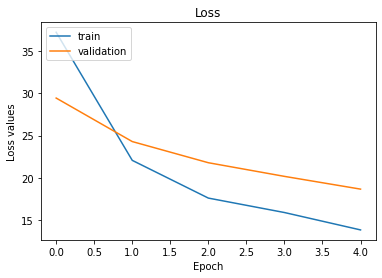

In [25]:
plot_hist(hist)

# Prédictions 

In [8]:
model = load_model('model1/text_detect_model.json')
model.load_weights('model1/text_detect.h5')

In [9]:
# retourne la liste des boites correspondantes à output pour une image de taille hauteur = h et largeur = w
# output : (grid_h,grid_w,1,5) et pour chaque case les 5 données sont: score, x, y, h, w
def decode_to_boxes(output, h, w, conf = 0.5):
    img_ht = h
    img_wd = w     
    grid_h,grid_w = output.shape[:2]
    final_boxes = []
    scores = []
    for i in range(grid_h):
        for j in range(grid_w):
            if output[i,j,0,0] > conf:   # On vérifie la confiance dans la présence d'une boite dans cette case
                                        # On ne garde que les boites avec une confiance supérieure à conf%
                temp = output[i,j,0,1:5]
                x_unit = ((j + (temp[0]))/grid_w)*img_wd   #position ds l'image selon x: (case + pos dans case) puis rescale
                y_unit = ((i + (temp[1]))/grid_h)*img_ht   #position ds la case selon y
                width = temp[2]*img_wd*1.3                 #largeur de la boite ds l'image, un peu agrandie
                height = temp[3]*img_ht*1.3                #hauteur de la boite ds l'image, un peu agrandie
                # On veut un format (dist gch bord gch boite, dist haut bord haut boite, dist gauche bord droite boite, dist haut bord bas boite)
                final_boxes.append([x_unit - width/2,y_unit - height/2 ,x_unit + width/2,y_unit + height/2])
                scores.append(output[i,j,0,0])
    return final_boxes,scores

# Intersection over Union
def iou(box1,box2):
    x1 = max(box1[0],box2[0])
    x2 = min(box1[2],box2[2])
    y1 = max(box1[1] ,box2[1])
    y2 = min(box1[3],box2[3])
    
    inter = (x2 - x1)*(y2 - y1)   # aire commune aux 2 boxes
    area1 = (box1[2] - box1[0])*(box1[3] - box1[1]) # aire box1
    area2 = (box2[2] - box2[0])*(box2[3] - box2[1]) # aire box2
    fin_area = area1 + area2 - inter                # aire totale de box1 U box2
    iou = inter/fin_area                            # part de l'intersection dans l'union
    return iou

def non_max(boxes, scores, iou_num):
    scores_sort = scores.argsort().tolist()   # Liste des indices des boites ordonnés par score
    keep = []    #liste des indices des box que l'on va garder
    while(len(scores_sort)):
        index = scores_sort.pop()
        keep.append(index)
        if(len(scores_sort) == 0):
            break

        iou_res = []    # Liste des iou de la boite d'index index avec les autres boites
        for i in scores_sort:
            iou_res.append(iou(boxes[index] , boxes[i]))     
        
        iou_res = np.array(iou_res)
        filtered_indexes = set((iou_res > iou_num).nonzero()[0])    
        # On a récupèré les indices tels que iou > iou_num : en fixant iou_num assez haut, on ne garde que les indices
        # tels que les deux boites sont fortement superposées : on suppose qu'il s'agit en fait de la même et on 
        # supprime donc celle avec des confiances moindres que la première
        scores_sort = [v for (i,v) in enumerate(scores_sort) if i not in filtered_indexes]  
    
    final = []
    for i in keep:
        final.append(boxes[i])
    
    return final

# Permet de passer du résultat du model (pour chaque case proba présence de texte et coordonnées du centre 
# de la bounding box et sa largeur et hauteur) à coin supérieur gauche, coin inférieur droit
# Permet aussi de gérer les boites incluses dans d'autres via iou.
def decode(output , ht , wd , iou=0.3, conf=0.5):
    boxes , scores = decode_to_boxes(output,ht,wd,conf)
    boxes = non_max(boxes,np.array(scores),iou)
    return boxes

In [10]:
def bgrToRgb(image):
    b,g,r = cv2.split(image)
    rgb_img = cv2.merge([r,g,b])
    return rgb_img

def predict_func(model, inp, iou=0.3, conf=0.5, name= None, save = False):
    ans = model.predict(inp)
    boxes = decode(ans[0],img_w,img_h,iou,conf)
    
    img = ((inp + 1)/2)  # on a mis les valeurs de pixel entre -1 et 1, on remet entre 0 et 1 pour afficher
    img = img[0]
    for i in boxes:
        i = [int(x) for x in i]
        img = cv2.rectangle(img , (i[0] ,i[1]) , (i[2] , i[3]) , color = (0,255,0) , thickness = 2)
        
    plt.imshow(bgrToRgb(img))
    plt.show()
    
    if save:
        res = cv2.imwrite(os.path.join('Results1/' , str(name) + '.jpg') , img*255.0)
        
def showpred(images, pred, iou=0.3, conf=0.5):
    for p in range(len(pred)):
        boxes = decode(pred[p], img_w ,img_h ,iou, conf)
        img = ((images[p] + 1)/2)

        for i in boxes:
            i = [int(x) for x in i]
            img = cv2.rectangle(img , (i[0] ,i[1]) , (i[2] , i[3]) , color = (0,255,0) , thickness = 2)

        plt.imshow(bgrToRgb(img))
        plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


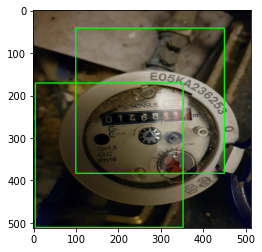

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


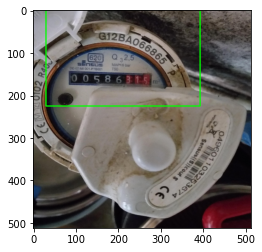

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


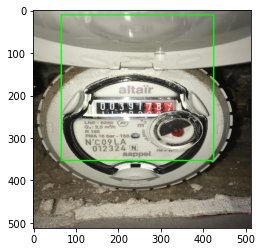

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


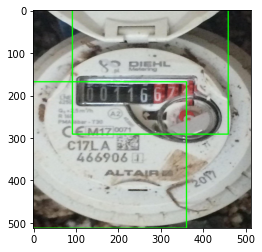

In [11]:
# prédictions set validation confiance = 0.5
predval = model.predict(X_val)
showpred(X_val, predval, 0.3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


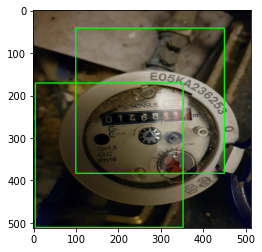

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


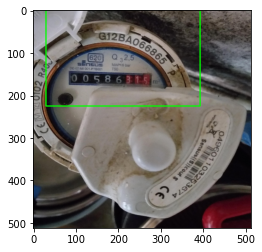

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


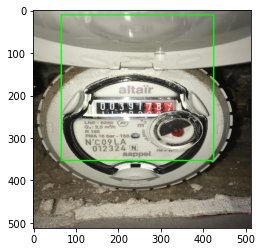

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


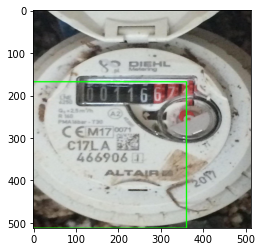

In [12]:
# prédictions set validation confiance = 0.7
showpred(X_val, predval, 0.3, 0.7)

### Prédiction ROI pour les images du dossier test

In [74]:
# Procédure pour tester sur un répertoire test
test_path = 'Datayolo/images'
def predtest(test_path):
    count = 0
    for i in os.listdir(test_path):
        if count < 32 and i != ".DS_Store":
            print(i)
            img = cv2.imread(os.path.join(test_path,i))
            img = cv2.resize(img,(512,512))
            img = (img - 127.5)/127.5
            predict_func(model, np.expand_dims(img,axis=0), iou=0.2 , conf=0.5)
            count += 1

8f18cb.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


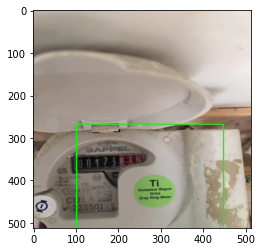

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1ec531.jpg


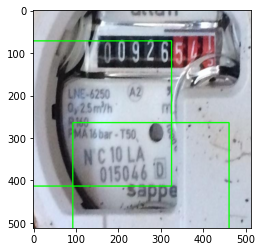

8fb787.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


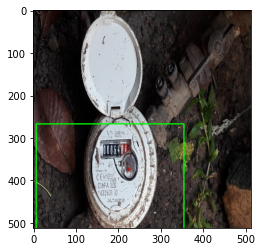

0c5ec4.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


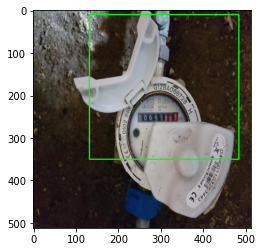

0d55b5.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


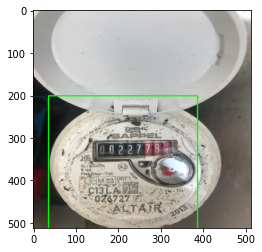

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5c708e.jpg


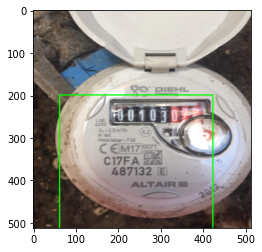

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5d3605.jpg


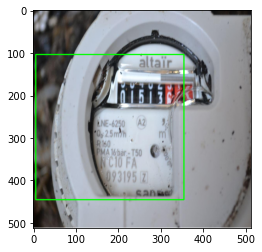

7bf2e3.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


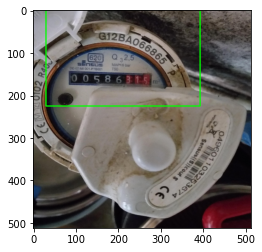

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1ba26b.jpg


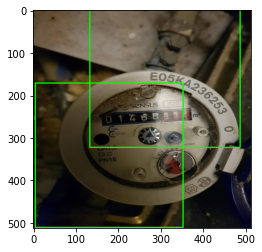

1f09ce.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


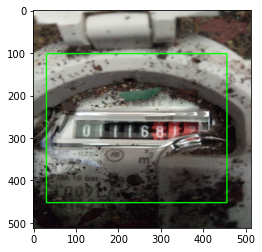

2e5f8d.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


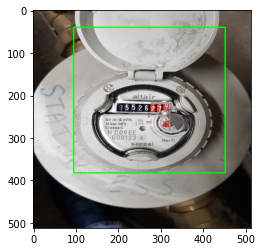

1a3c33.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


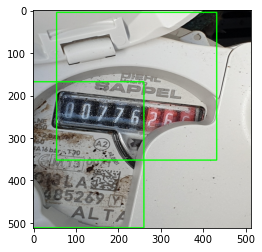

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0c429f.jpg


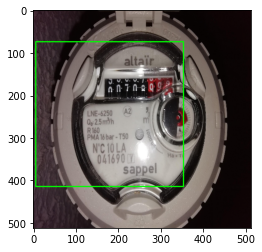

6caf66.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


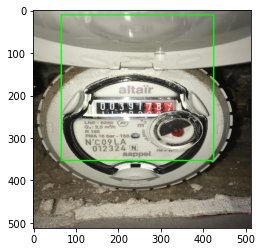

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7e609e.jpg


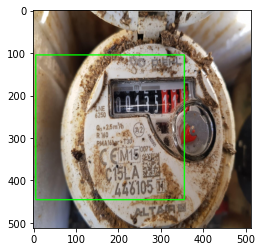

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7bbb2d.jpg


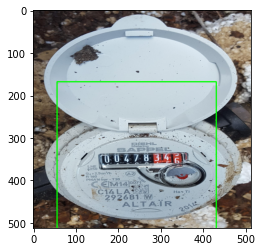

6ad7e9.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


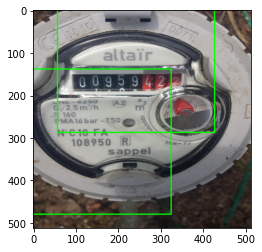

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0cfa42.jpg


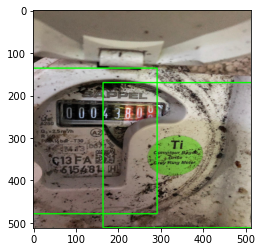

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6a09b5.jpg


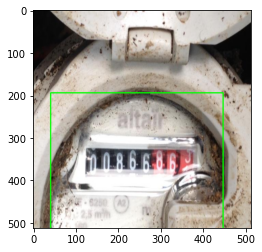

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4b1339.jpg


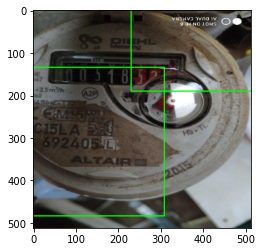

1e157c.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


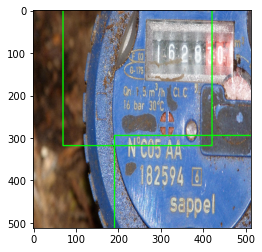

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


03e8fc.jpg


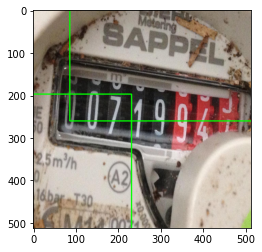

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4aefa8.jpg


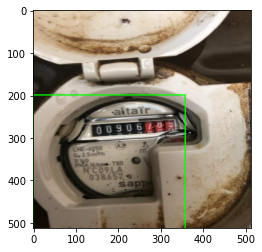

8d929e.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


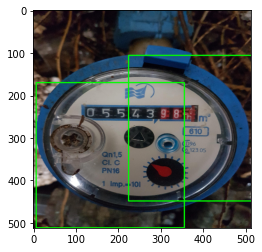

1aa5db.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


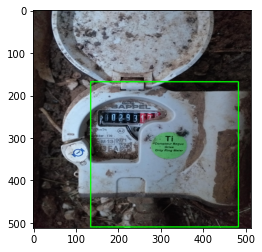

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7f8ec9.jpg


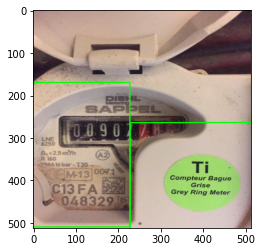

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


5c7106.jpg


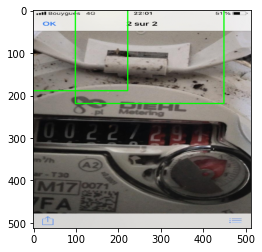

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2ee109.jpg


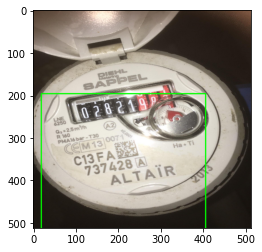

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1df3e4.jpg


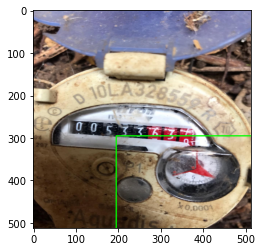

0cee7a.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


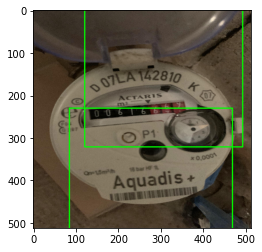

3af34b.jpg


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


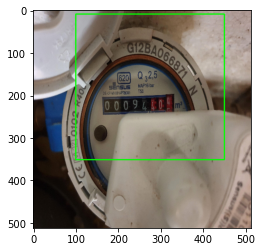

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3beb85.jpg


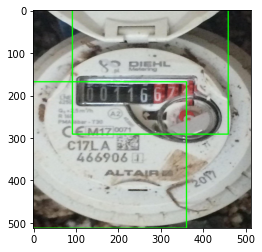

In [75]:
predtest(test_path)

## Découpage de l'image
#### On découpe l'image suivant ses ROI

In [13]:
# Plot des roi de chaque image
# on récupère dans un liste les rois et leurs coordonnées pour chaque image
def showdecoupimages(images, pred, iou=0.3):
    listerois = []
    for p in range(len(pred)):
        rois = []
        coords = []
        data = [rois,coords]
        boxes = decode(pred[p], img_w, img_h, iou=0.3, conf=0.5)
        img = ((images[p] + 1)/2)
        print(len(boxes))
        for i in boxes:
            i = [int(x) for x in i]
            i = [max(0,x) for x in i]
            x,y, xplusw, yplush = i[0], i[1], i[2], i[3]
            coords.append([x,y,xplusw,yplush])
            roi = img[y:yplush, x:xplusw]
            rois.append(roi)
            plt.imshow(bgrToRgb(roi))
            plt.show()
            
        listerois.append(data)
        
    return np.array(listerois)

2


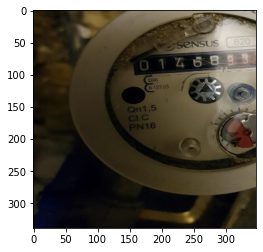

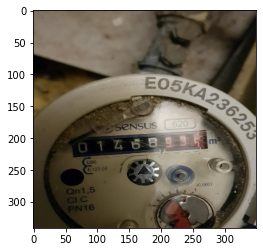

1


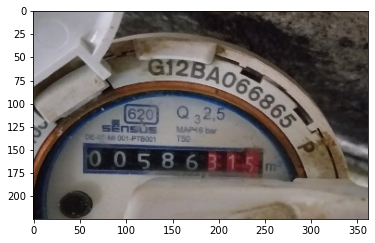

1


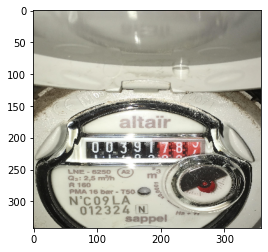

2


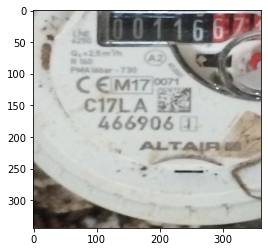

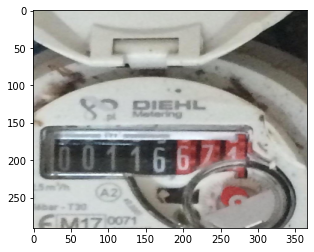

<ipython-input-13-edffb1e8891b>:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(listerois)


In [14]:
predval = model.predict(X_val)
listerois = showdecoupimages(X_val, predval)

In [15]:
# donne l'intersection de 2 boites. Si l'intersection est vide on renvoie la première boite
def intersection(box1,box2):
    x1 = max(box1[0],box2[0])
    x2 = min(box1[2],box2[2])
    y1 = max(box1[1] ,box2[1])
    y2 = min(box1[3],box2[3])
    
    if x2 <= x1 or y2 <= y1:
        return box1
    
    return [x1,y1,x2,y2]

# permet de récupérer et d'afficher l'intersection des rois d'une image
def decoupintersection(images, listerois):
    listeinter = []
    imgs = ((images + 1)/2)
    idx = 0
    for data in listerois:
        inter = data[1][0]
        img = imgs[idx]
        if len(data[1])>1:
            inter = intersection(data[1][0],data[1][1])
            if len(data[1])>2:
                for i in range(2,len(data[1])):
                    inter = intersection(inter,data[1][i])
        x,y, xplusw, yplush = inter
        roi = img[y:yplush, x:xplusw]
        plt.imshow(bgrToRgb(roi))
        plt.show()
        
        new_data = (roi,inter)
        listeinter.append(new_data)
        idx +=1
        
    return np.array(listeinter)

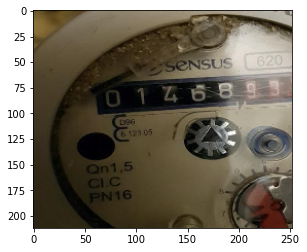

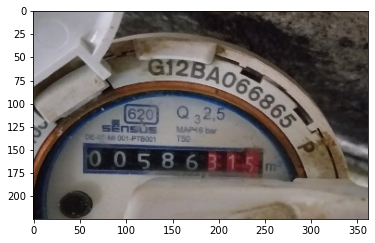

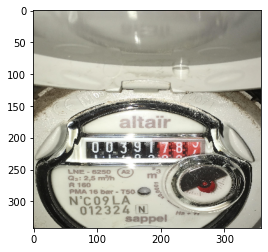

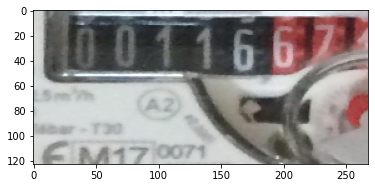

<ipython-input-15-9f2bb6bf9985>:34: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(listeinter)


In [16]:
# intersection des ROI pour chaque image de val : donne la ROI finale des images
listeinter = decoupintersection(X_val, listerois)  

In [17]:
np.save('Data/listeinterval.npy', listeinter)

1


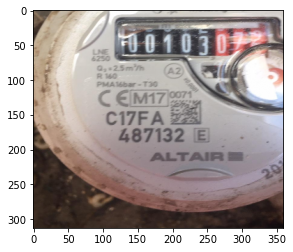

1


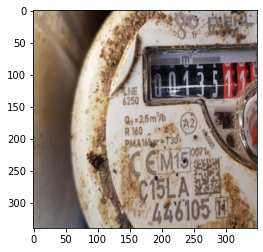

1


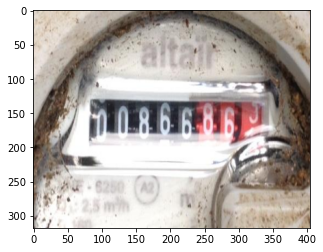

2


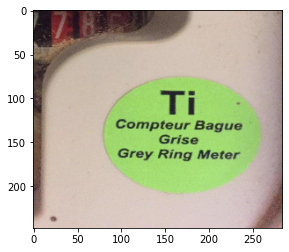

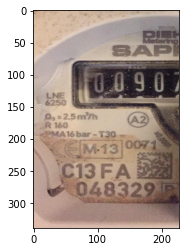

2


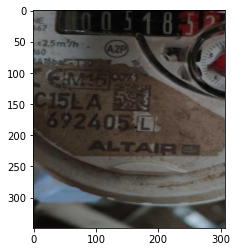

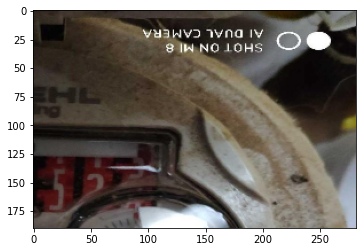

1


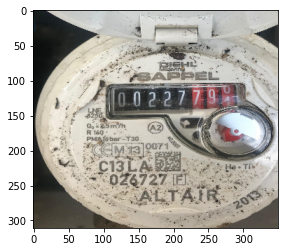

2


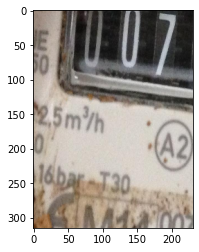

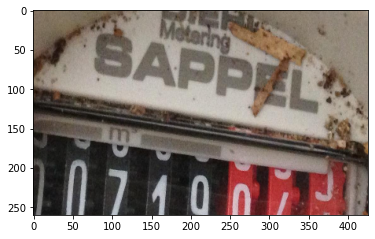

1


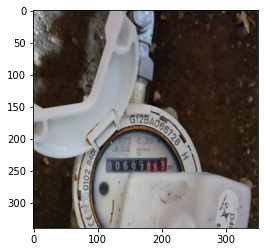

1


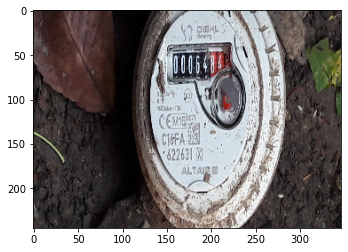

1


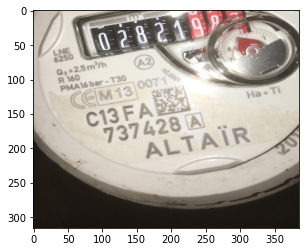

1


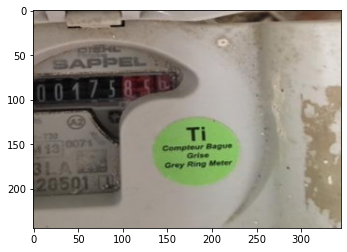

3


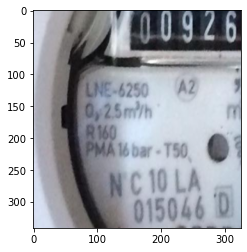

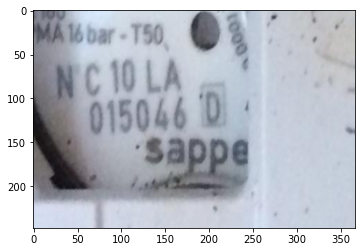

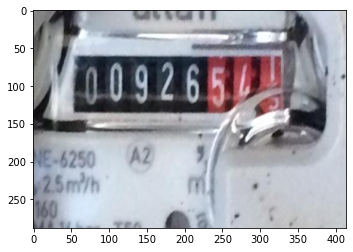

3


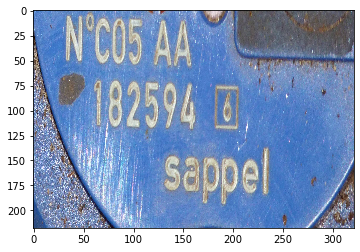

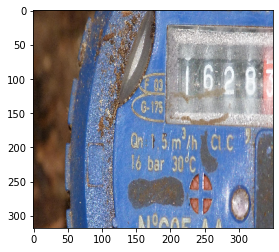

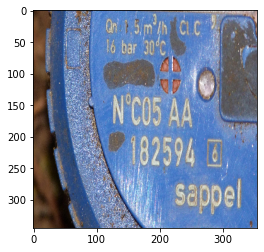

1


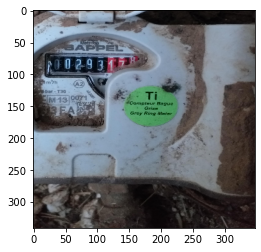

1


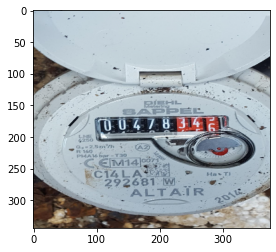

1


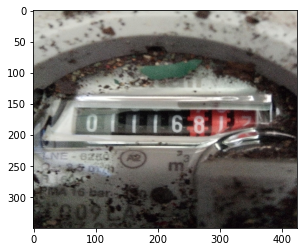

1


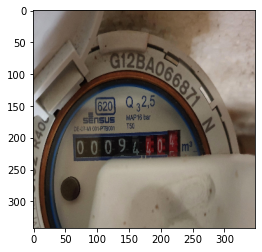

2


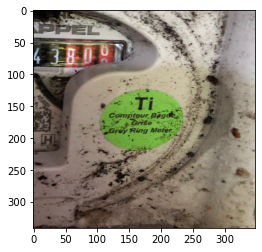

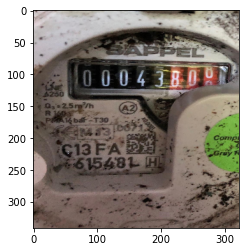

2


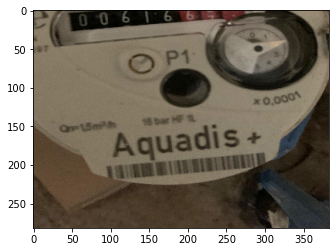

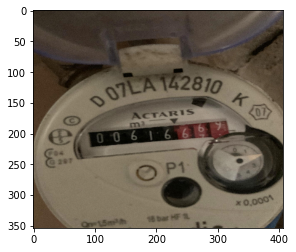

3


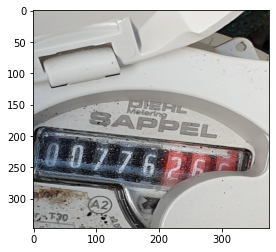

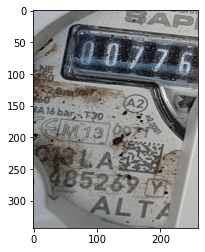

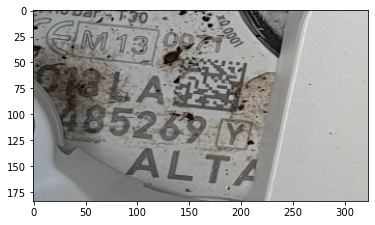

2


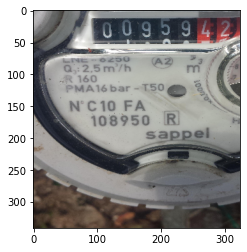

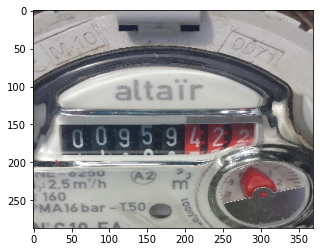

3


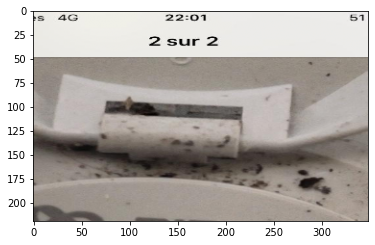

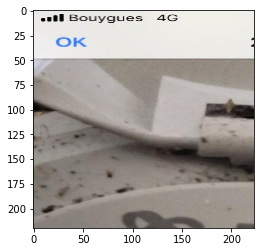

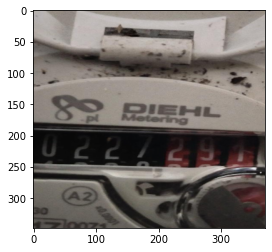

2


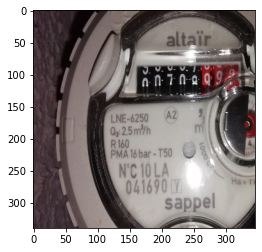

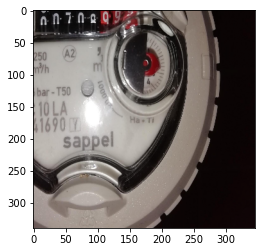

1


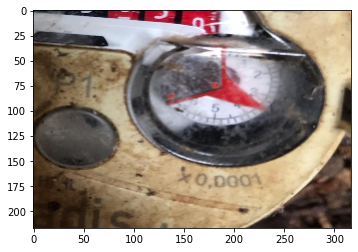

2


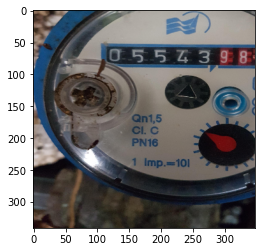

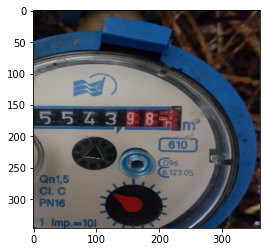

1


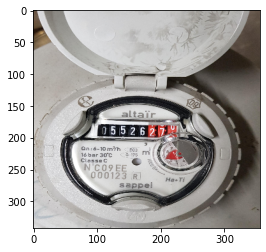

3


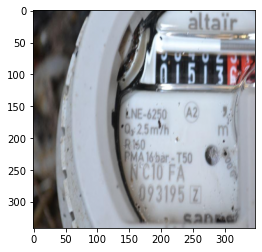

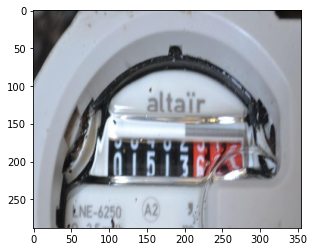

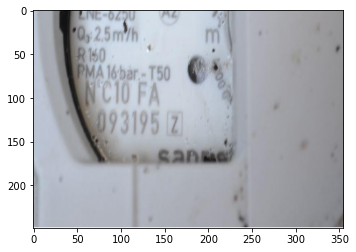

1


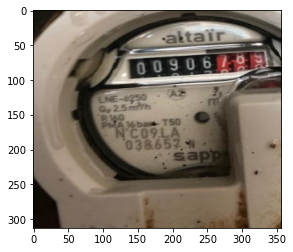

<ipython-input-13-edffb1e8891b>:24: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(listerois)


In [18]:
# On essaye aussi sur le set de train
predtrain = model.predict(X_train)
listeroistrain = showdecoupimages(X_train, predtrain)

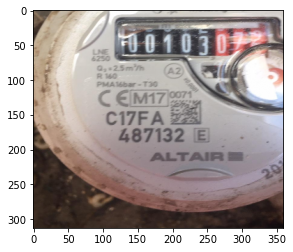

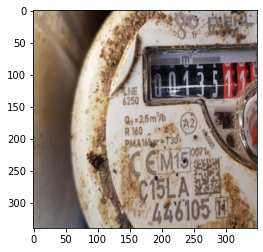

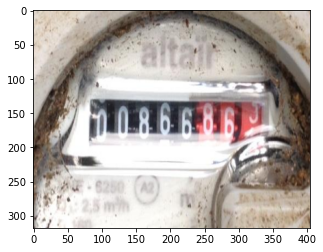

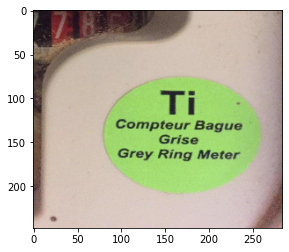

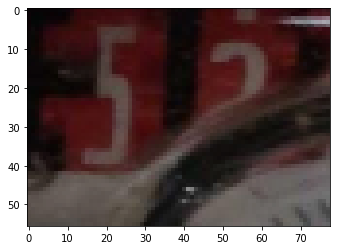

...

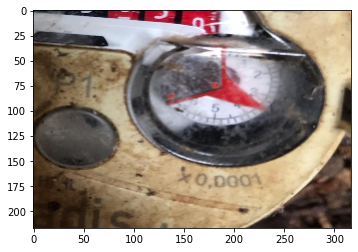

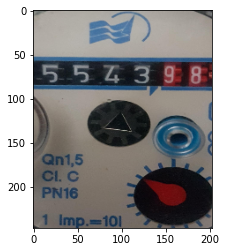

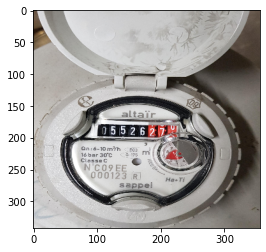

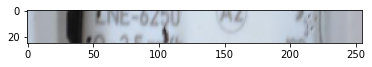

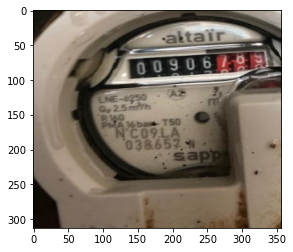

<ipython-input-15-9f2bb6bf9985>:34: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return np.array(listeinter)


In [19]:
listeintertrain = decoupintersection(X_train, listeroistrain)

In [20]:
np.save('Data/listeintertrain.npy', listeintertrain)

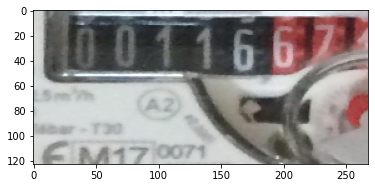

In [83]:
# Une des ROI qui a bien réussi
roitest = listeintertrain[12][0]
plt.imshow(bgrToRgb(roitest))
plt.show()

## Lecture des ROI avec tesseract

On tente de lire les ROI avec Tesseract directement, cela pourrait peut-être marcher avec une bonne ROI.

In [167]:
# grayscale 
def get_grayscale(image):
    img = image.astype(np.float32)
    img = img * 255
    res = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    res = res.astype(np.uint8)
    return res

#  thresholding avec valeur de seuil automatique via optimisation OTSU
def thresholdingOTSU(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

#canny edge detection
def canny(image, t1 = 100, t2= 200, ap = 3):
    return cv2.Canny(image, t1, t2, apertureSize = ap)

# Plot des images 
def plotimages(images, cmap = 'gray'):
    keys = list(images.keys())
    taille = len(keys)
    columns = 2
    if taille%2 == 0:
        rows = taille//2
    else :
        rows = taille//2 + 1
    fig = plt.figure(figsize=(8*columns,8*rows))
    ax = []
    
    for i in range(taille):
        ax.append( fig.add_subplot(rows, columns, i+1) )
        ax[-1].set_title('Image - ' + keys[i]) 
        plt.imshow(images[keys[i]], cmap=cmap) 

In [166]:
def wordBoxes(image, conf = 50):
    new_image = image.copy()
    if len(new_image.shape) ==2 :
        h, w = new_image.shape
    else:
        h, w, c = new_image.shape
    data = pytesseract.image_to_data(new_image, output_type=Output.DICT)
    n_boxes = len(data['text'])
    for i in range(n_boxes):
        # On n'affiche que les boxes avec une confiance surpérieure à conf% (50 par défaut)
        if int(data['conf'][i]) > conf:
            (x, y, w, h) = (data['left'][i], data['top'][i], data['width'][i], data['height'][i])
            new_image = cv2.rectangle(new_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
 
    return new_image, data

def plotImagesWordBox(images):
    new_images = {}
    datas = {}
    keys = list(images.keys())
    for i in range(len(keys)):
        image = images[keys[i]]
        new_image, data = wordBoxes(image)
        new_images[keys[i]] = new_image
        datas[keys[i]] = data
    plotimages(new_images, cmap = 'plasma')
    return datas

In [178]:
gray = get_grayscale(roitest)
threshOTSU = thresholdingOTSU(gray)
cannyed1 = canny(gray)
cannyed2 = canny(gray, 200, 250)
cannyed3 = canny(gray, 200, 300)
cannyed4 = canny(gray, 150, 200)
cannyed5 = canny(gray, 150, 250)
images = {'gray': gray,
          'thresholingOTSU': threshOTSU, 
          'canny1': cannyed1,
          'canny2': cannyed2,
          'canny3': cannyed3,
          'canny4': cannyed4,
          'canny5': cannyed5}

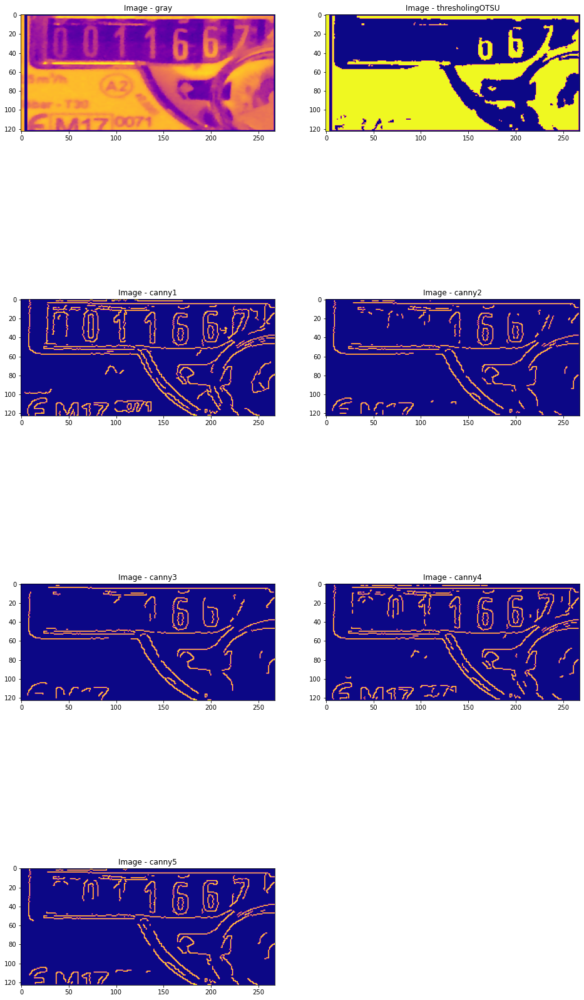

In [179]:
datas = plotImagesWordBox(images)

In [164]:
# En essayant de lire directement
# psm 6 : block de text
custom_config6digit = r'--oem 3 --psm 6 outbase digits'
print(pytesseract.image_to_string(edges, config=custom_config6digit))

Toujours aucun résultats avec Tesseract. Aucune des ROI filtrée n'a été lue.

On va utiliser un autre modèle pour lire.